In [1]:
%load_ext blackcellmagic

In [2]:
import networkx as nx
import numpy as np
import pandas as pd
import numba
from math import ceil

from scipy.spatial import Voronoi, voronoi_plot_2d, Delaunay, ConvexHull
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import tqdm

In [3]:
import colorcet as cc
import holoviews as hv
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [4]:
import lattice_signaling as lsig
from scipy.sparse import csr_matrix

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [5]:
def act_sc_vmean(t, E_save, thresh, sender_idx=0, r=1):
    """
    """
    # Check if there are ony 2 cells
    assert E_save.shape[1] == 2, "must supply data for 2 cells (E_save of shape (n_t, 2))"
    
    # Find where transceiver expression crosses threshold
    crossed = np.argmax(E_save[:, 1 - sender_idx] > thresh)
    
    # If it never does, return 0. Otherwise, return velocity
    if crossed == 0:
        return 0
    else:
        return r / (t[crossed] - t[0]) 

In [6]:
def act_vmean(t, X, E_save, thresh, L, chull=False):
    """
    """
    
    # Get time difference
    dt = t[-1] - t[0]
    
    # Get the 
    if X.shape[0] < 3:
        X_where_bounds = np.array([i for i in range(X.shape[0])])
    else:
        X_where_bounds = ConvexHull(X).vertices
    
    crossed = np.argmax(E_save[:, X_where_bounds].sum(axis=1) > 0)
    if crossed > 0:
        tr = t[:crossed]
    else:
        tr = t.copy()

    # Get activated cells at first and last time
    Et0, Etlast = E_save[0] > thresh, E_save[-1] > thresh
    
    # Calculate area using convex hull volume or sum of cell areas
    if chull:
        
        # Exclude time-points with <3 points (throws error)
        if np.sum(E0) < 3:
            a0 = 0
        else:
            a0 = ConvexHull(X[Et0]).volume
            
        if np.sum(Etlast) < 3:
            alast = 0
        else:
            alast = ConvexHull(X[Etlast]).volume
    else:
        a0 = E0.sum() * np.sqrt(3)/2
        alast = Etlast.sum() * np.sqrt(3)/2
    
    dr = np.diff(np.sqrt(np.array([a0, alast]) / np.pi))
    
    return dr/dt
    

In [7]:
def act_radius_hex(t, X, E_save, thresh, L, chull=False):
    """
    """
    
    # Get time-step
    dt = t[1] - t[0]
    
    # Get activated cells at each time
    Et = E_save > thresh
    
    # Calculate area using convex hull volume or sum of cell areas
    if chull:
        
        # Exclude time-points with <3 points (throws error)
        where_chull = np.argwhere(np.sum(Et, axis=1) > 2).ravel()
        a = np.zeros(Et.shape[0], dtype=np.float32)
        for i in where_chull: 
            a[i] = ConvexHull(X[Et[i]]).volume
    else:
        Etsum = Et.sum(axis=1)
        a = Etsum * np.sqrt(3)/2
    
    return get_radius(t, a, L)
    
    
@numba.njit
def get_radius(t, a, L):
    """
    """
    # Calculate estimated radius, assuming cells are 
    #   identical hexagons of side length 1/sqrt(3)
    r  = np.sqrt(a / np.pi).astype(np.float32)
    
    # Truncate if the radius reaches the periodic boundary
    bound = (L-1)*np.sqrt(3)/4
    crossed = np.argmax(r > bound)
    if crossed > 0:
        r = r[:crossed]
        tr = t[:crossed]
    else:
        tr = t.copy()
        
    # Isolate time-points where area changes
    jumps = np.diff(r[:-1]).nonzero()[0]
    
    # Construct output
    t_out = np.empty(jumps.size + 2)
    r_out = np.empty(jumps.size + 2)
    t_out[0], t_out[1:-1], t_out[-1] = tr[0], tr[jumps], tr[-1]
    r_out[0], r_out[1:-1], r_out[-1] = r[0], r[jumps], r[-1]
    
    return t_out, r_out

In [8]:
def hex_Adj(s, r=1, dtype=np.float32, csr=True):
    """
    Returns the a hexagonal lattice and its adjacency 
    matrix Adj, the proportion of its perimeter that each
    hexagon shares with other hexagons.
    """
    # Get # cells
    n = s ** 2
    
    # Make hexagonal grid
    X = lsig.hex_grid_square(n, r=r)
    
    # Construct adjacency matrix
    lij = 1 / 6   # proportion of perimeter shared
    Adj = np.zeros((n,n), dtype=dtype)
    for i in range(s):
        for j in range(s):
            
            # Get neighbors of cell at location i, j
            nb = np.array(
                [
                    (i    , j + 1),
                    (i    , j - 1),
                    (i - 1, j    ),
                    (i + 1, j    ),
                    (i - 1 + 2*(j%2), j - 1),
                    (i - 1 + 2*(j%2), j + 1),
                ]
            ) % s
            
            # Populate Adj
            nbidx = np.array([ni*s + nj for ni, nj in nb])
            Adj[i*s + j, nbidx] = lij
    
    if csr:
        Adj = csr_matrix(Adj)
    
    return X, Adj

In [9]:
def integrate_DDE(
    t_span,
    rhs,
    dde_args,
    E0,
    delay,
    progress_bar=False,
    min_delay=5,
):
    # Get # time-points, dt, and # cells
    n_t = t_span.size
    dt = t_span[1] - t_span[0]
    n_c = E0.size
    
    # Get delay in steps
    step_delay = np.atleast_1d(delay) / dt
    assert (step_delay >= min_delay), (
        "Delay time is too short. Lower dt or lengthen delay."
    )
    step_delay = ceil(step_delay)
    
    # Initialize expression vector
    E_save = np.empty((n_t, n_c), dtype=np.float32)
    E_save[0] = E = E0
    
    # Construct time iterator
    iterator = np.arange(1, n_t)
    if progress_bar:
        iterator = tqdm.tqdm(iterator)

    for step in iterator:
        # Get past E
        past_step = max(0, step - step_delay)
        E_delay = E_save[past_step]
        
        # Integrate
        dE_dt = rhs(E, E_delay, *dde_args)
        E = np.maximum(0, E + dE_dt * dt) 
        E_save[step] = E
    
    return E_save


In [19]:
L = 21
n = L ** 2
X, Adj = hex_Adj(L, r=1, csr=False)
sender_idx = lsig.get_center_cells(X)[0]

In [20]:
# Define RHS
@numba.njit
def hex_tc_rhs(E, E_delay, alpha, k, p, delta, lambda_, eps, sender_idx):
    """
    Returns RHS of transceiver DDE.
    """
    # Get signaling across each interface
    E_bar = eps * (Adj @ E_delay)
    
    # Calculate dE/dt
    dE_dt = (
        lambda_
        + alpha * (E_bar ** p) / (k ** p + (delta * E_delay) ** p + E_bar ** p)
        - E
    )
    
    # Set sender cell to zero
    dE_dt[sender_idx] = 0
    
    return dE_dt

In [12]:
alpha = 3
k_s = 0.05
p_s = 2
delta = 3
lambda_ = 1e-5
eps = 0.4
params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

In [13]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [14]:
E_save = integrate_DDE(
    t_span=t,
    rhs=hex_tc_rhs,
    dde_args=params,
    E0=E0,
    delay=delay,
    progress_bar=True,
)

100%|██████████| 1000/1000 [00:02<00:00, 391.95it/s]


Sweet.

- Define the TC RHS
- Define the integration function
- Pick an example set of params
- Integrate
- Visualize results (look at Jake's code for overlapping circles? Highlight interface?)
- Try a few param sets, see what happens

In [15]:
pskip = 200
n_t_skip = t[::pskip].shape[0]

In [16]:
pE = E_save[::pskip]

pEdata = {
    f"cell_{i}": pE[:, i] for i in range(E_save.shape[1])
}
pEdata["time"] = t[::pskip]

pEdata = pd.DataFrame(pEdata).melt(id_vars=["time"])
pEdata.columns = ["time", "cell", "expression"]
pEdata["X_coord"] = np.repeat(X[:, 0], n_t_skip)
pEdata["Y_coord"] = np.repeat(X[:, 1], n_t_skip)

:NdLayout   [time]
   :Points   [X_coord,Y_coord]   (time,expression)
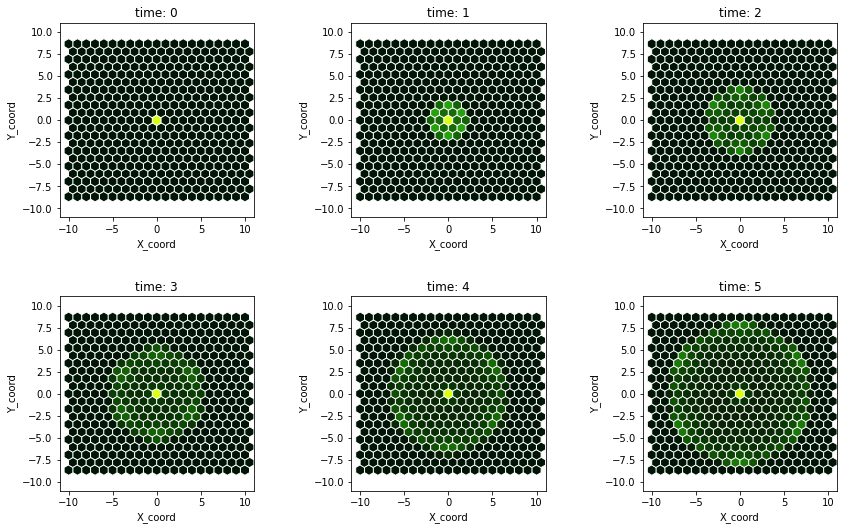

In [17]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=pEdata,
    kdims=["X_coord", "Y_coord"],
    vdims=["time", "expression"]
).groupby(
    "time"
).opts(
    color="expression",
    s=110,
    cmap=cc.kgy,
    show_legend=False,
    aspect=1,
    xlim=(-L/2*1.05, L/2*1.05),
    ylim=(-L/2*1.05, L/2*1.05),
).options(
    {'Points': {'marker': "h", "edgecolor": "white"}}
).layout().cols(3)

plt

:Points   [x,y]
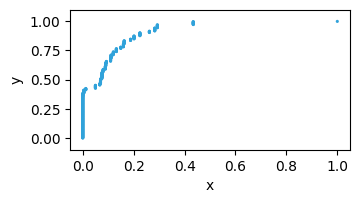

In [18]:
%%capture --no-stdout --no-display

plt = hv.Points(
    (E_save[-1], (np.argsort(np.argsort(E_save[-1])) / E_save.shape[1]))
).opts(s=5, aspect=2)
hv.output(plt, dpi=100)

I could apply a threshold, get the convex hull, calculate average radius.

Now I'll to calculate the speed of propagation by applying a threshold and calculating the average radius at each time.

In [19]:
tr, r = act_radius_hex(t, X, E_save, 0.1, L, chull=True)

In [20]:
vmean = (r[-1] - r[0]) / (tr[-1] - t[0])
vmean

1.5432889938354493

In [21]:
# v = np.diff(r) / np.diff(tr)
# tv = tr[:-1] + np.diff(tr)/2

Now let's use vmean as a metric! And track this across a parameter sweep

<hr>

In [22]:
import numpy as np
import pandas as pd
import numba
from math import ceil

from scipy.spatial import Voronoi, voronoi_plot_2d, Delaunay, ConvexHull
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import tqdm

In [23]:
import lattice_signaling as lsig
from scipy.sparse import csr_matrix

In [34]:
import colorcet as cc
import holoviews as hv
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [63]:
alpha = 1.5
# k_s = 0.2
p_s = 2
# delta = 5
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

In [64]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [65]:
k_s_space = np.logspace(-2, np.log10(0.5), 20)
delta_space = np.linspace(0, 5, 6)
eps_space = np.linspace(0.05, 1, 20)
free_params = (k_s_space, delta_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [66]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans2 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    k_s, delta, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans2[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:03<00:00, 19.38it/s]


In [67]:
data2 = pd.DataFrame({
    "signaling threshold": param_space[:, 0], 
    "feedback strength": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": vmeans2,
})

:NdLayout   [feedback strength]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,feedback strength)
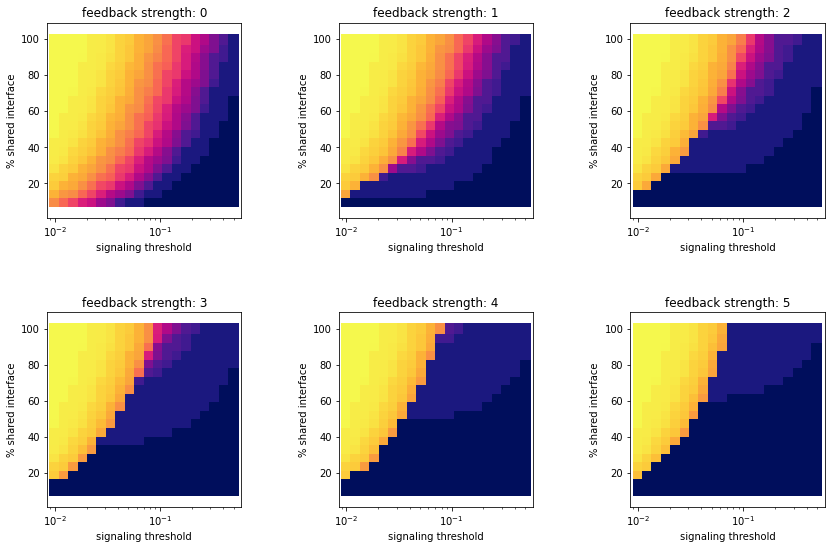

In [68]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data2,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "feedback strength"],
).groupby(
    ["feedback strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=120,
    aspect=2.3,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(
    3
# ).opts(
#     title="Negative feedback sharpens signaling phase boundary",
)


plt

<hr>

In [26]:
# alpha = 1.5
# k_s = 0.2
p_s = 2
delta = 5
lambda_ = 1e-5
eps = 1.
# E0_val = 1

delay = 0.4

dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)


alpha_space = np.linspace(0.5, 3, 6)
k_s_space = np.logspace(-2, np.log10(0.5), 20)
# delta_space = np.linspace(0, 5, 6)
# eps_space = np.linspace(0.05, 1, 20)
E0_space = np.linspace(0.05, 1, 20)
free_params = (alpha_space, k_s_space, E0_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans10 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    alpha, k_s, E0_val = param_space[i]
    #     k_s, delta, E0_val = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    E0[sender_idx] = E0_val
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans10[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [04:45<00:00,  8.40it/s] 


In [27]:
data10 = pd.DataFrame({
    "promoter strength": param_space[:, 0], 
    "signaling threshold": param_space[:, 1], 
    "sender expression": param_space[:, 2], 
    "Mean wavefront speed": vmeans10,
})

:NdLayout   [promoter strength]
   :Points   [signaling threshold,sender expression]   (Mean wavefront speed,promoter strength)
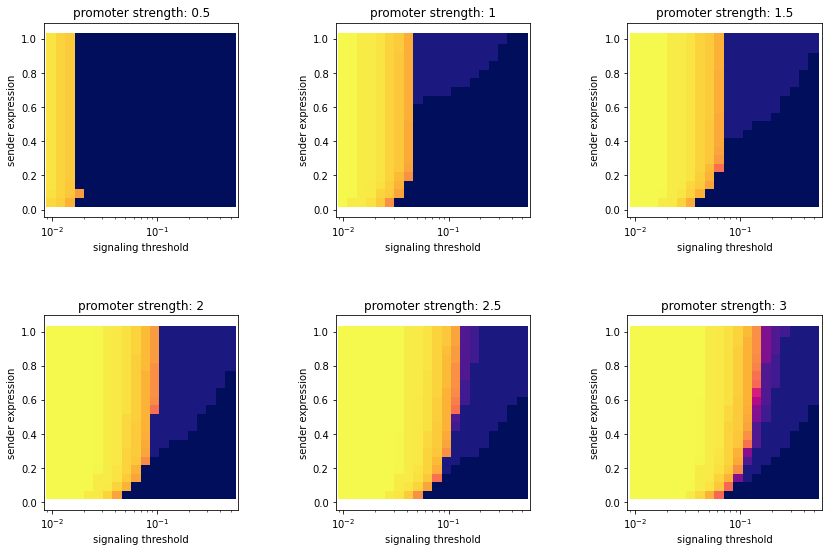

In [28]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data10,
    kdims=["signaling threshold", "sender expression"],
    vdims=["Mean wavefront speed", "promoter strength"],
).groupby(
    ["promoter strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=120,
    aspect=2.3,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(
    3
# ).opts(
#     title="Negative feedback sharpens signaling phase boundary",
)


plt

D'ho!

<hr>

In [166]:
alpha = 1.5
# k_s = 0.2
p_s = 1
# delta = 5
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

k_s_space = np.logspace(-2, np.log10(0.5), 20)
delta_space = np.linspace(0, 5, 6)
eps_space = np.linspace(0.05, 1, 20)
free_params = (k_s_space, delta_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans7 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    k_s, delta, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans7[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:06<00:00, 19.01it/s]


In [167]:
data7 = pd.DataFrame({
    "signaling threshold": param_space[:, 0], 
    "feedback strength": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": vmeans7,
})

:NdLayout   [feedback strength]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,feedback strength)
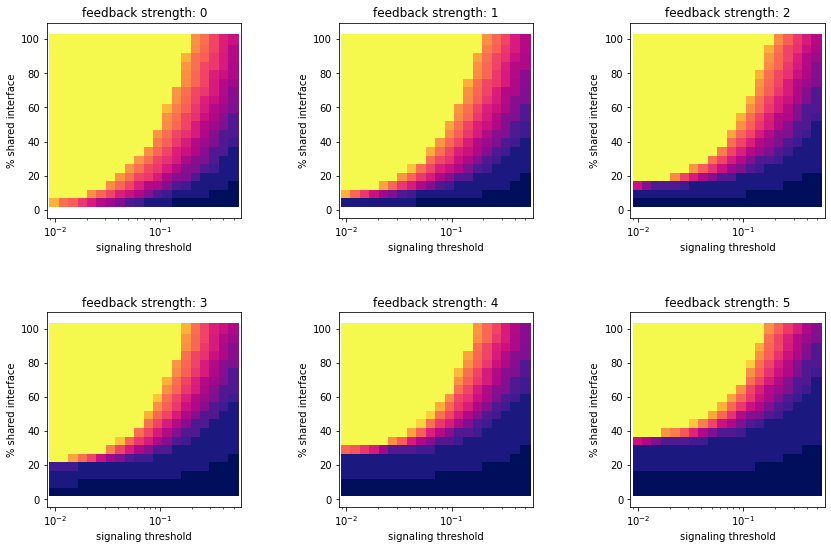

In [168]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data7,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "feedback strength"],
).groupby(
    ["feedback strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=120,
    aspect=2.3,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(
    3
# ).opts(
#     title="Negative feedback sharpens signaling phase boundary",
)


plt

<hr>

In [189]:
alpha = 1.5
# k_s = 0.2
# p_s = 2
delta = 0
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

In [190]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [192]:
k_s_space = np.logspace(-2, np.log10(0.5), 20)
p_s_space = np.linspace(1, 6, 6)
eps_space = np.linspace(0.05, 1, 20)
free_params = (k_s_space, p_s_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [193]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans3 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    k_s, p_s, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans3[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:29<00:00, 16.04it/s]


In [194]:
data3 = pd.DataFrame({
    "signaling threshold": param_space[:, 0], 
    "ultrasensitivity": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": vmeans3,
})

:NdLayout   [ultrasensitivity]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,ultrasensitivity)
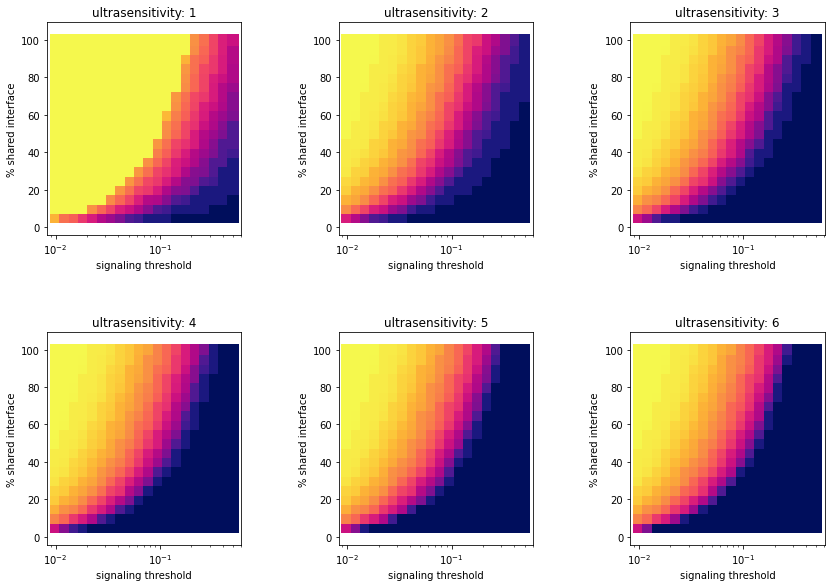

In [195]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data3,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "ultrasensitivity"],
).groupby(
    ["ultrasensitivity"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=130,
    aspect=2.1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(3)


plt

<hr>

In [70]:
# alpha = 1.6
k_s = 0.05
p_s = 2
# delta = 5
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

In [71]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [72]:
alpha_space = np.linspace(0.5, 3, 6)
delta_space = np.linspace(0, 3, 20)
eps_space = np.linspace(0.05, 1, 20)
free_params = (alpha_space, delta_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [73]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans4 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    alpha, delta, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans4[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:07<00:00, 18.82it/s]


In [74]:
data4 = pd.DataFrame({
    "promoter strength": param_space[:, 0], 
    "feedback strength": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": vmeans4,
})

:NdLayout   [promoter strength]
   :Points   [feedback strength,% shared interface]   (Mean wavefront speed,promoter strength)
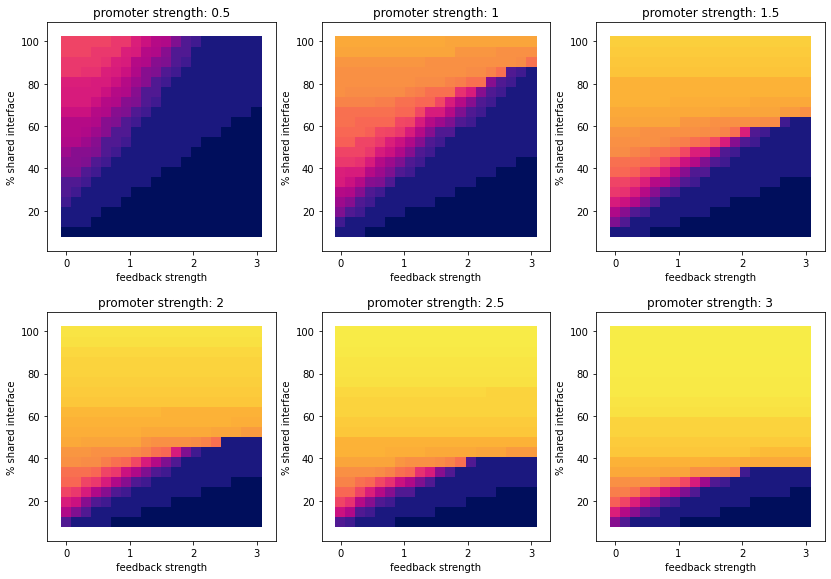

In [75]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data4,
    kdims=["feedback strength", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter strength"],
).groupby(
    ["promoter strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
#     logx=True,
    s=120,
    aspect=1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

<hr>

In [79]:
# alpha = 1.6
# k_s = 0.05
p_s = 2
delta = 3
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

# delay = 0.4

In [80]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [81]:
alpha_space = np.linspace(0.5, 3, 6)
k_s_space = np.logspace(-2, np.log10(0.5), 20)
eps_space = np.linspace(0.05, 1, 20)
free_params = (alpha_space, k_s_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [82]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans8 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    alpha, k_s, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans8[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:03<00:00, 19.51it/s]


In [83]:
data8 = pd.DataFrame({
    "promoter strength": param_space[:, 0], 
    "signaling threshold": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": vmeans8,
})

:NdLayout   [promoter strength]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,promoter strength)
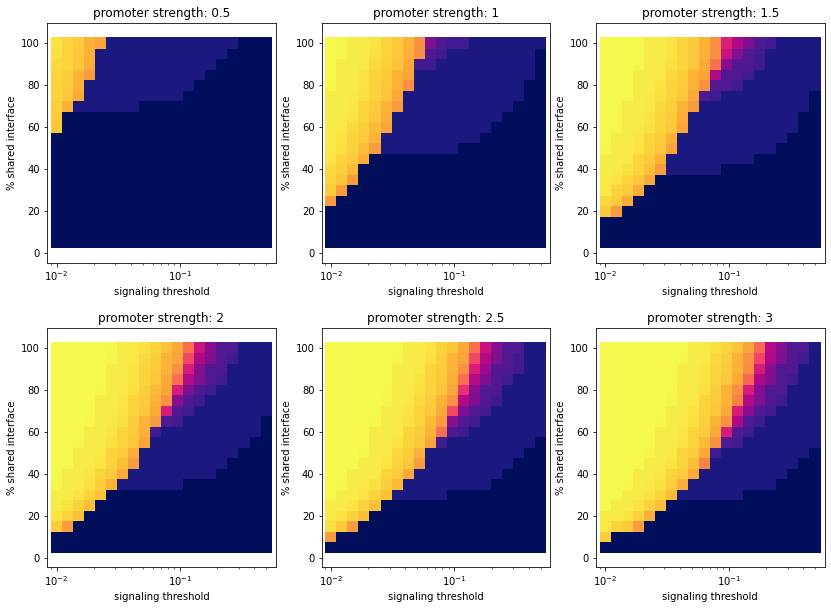

In [94]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data8,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter strength"],
).groupby(
    ["promoter strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=130,
    aspect=2.2,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

<hr>

In [102]:
# alpha = 1.6
k_s = 0.05
p_s = 2
delta = 3
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

# delay = 0.4

In [103]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [104]:
alpha_space = np.linspace(0.5, 3, 6)
eps_space = np.linspace(0.05, 1, 20)
tau_space = np.linspace(0.05, 1, 20)
free_params = (alpha_space, eps_space, tau_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [105]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans5 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    alpha, eps, delay = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans5[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2400/2400 [02:00<00:00, 19.96it/s]


In [106]:
data5 = pd.DataFrame({
    "promoter strength": param_space[:, 0], 
    "% shared interface": param_space[:, 1] * 100, 
    "delay time": param_space[:, 2],
    "Mean wavefront speed": vmeans5,
})

:NdLayout   [promoter strength]
   :Points   [delay time,% shared interface]   (Mean wavefront speed,promoter strength)
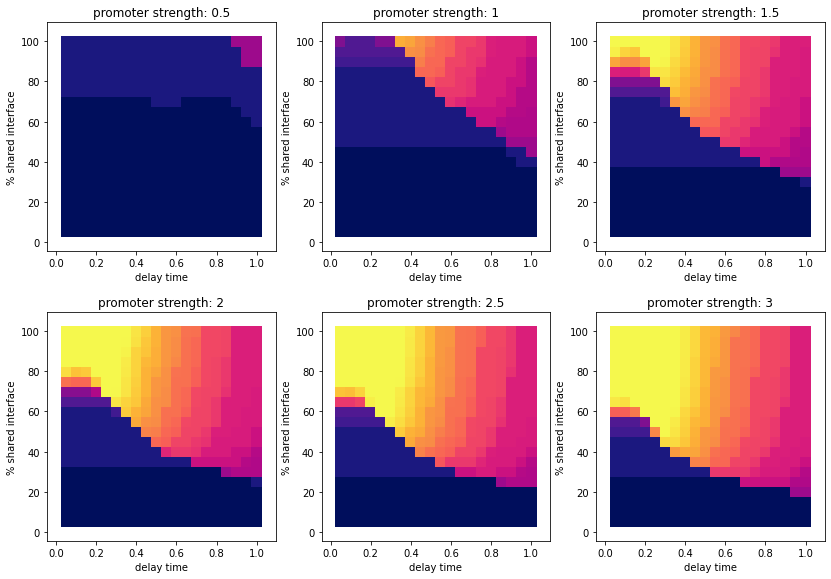

In [107]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data5,
    kdims=["delay time", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter strength"],
).groupby(
    ["promoter strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
#     logx=True,
    s=120,
    aspect=1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

<hr>

In [95]:
alpha = 1.5
k_s = 0.05
p_s = 2
# delta = 2
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

# delay = 0.4

In [96]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [97]:
delta_space = np.linspace(0, 3, 20)
eps_space = np.linspace(0.05, 1, 20)
tau_space = np.linspace(0.1, 0.7, 7)
free_params = (delta_space, eps_space, tau_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [98]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans6 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    delta, eps, delay = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans6[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2800/2800 [02:20<00:00, 19.87it/s]


In [99]:
data6 = pd.DataFrame({
    "feedback strength": param_space[:, 0], 
    "% shared interface": param_space[:, 1] * 100, 
    "delay time": param_space[:, 2],
    "Mean wavefront speed": vmeans6,
})

:NdLayout   [delay time]
   :Points   [feedback strength,% shared interface]   (Mean wavefront speed,delay time)
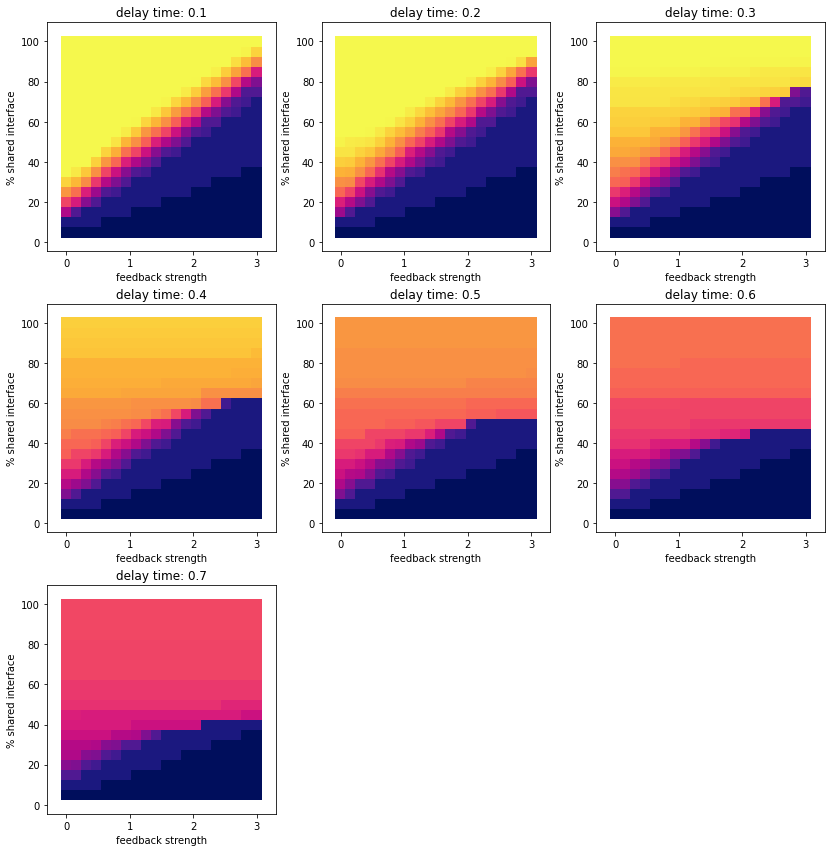

In [100]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data6,
    kdims=["feedback strength", "% shared interface",],
    vdims=["Mean wavefront speed", "delay time"],
).groupby(
    ["delay time"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
#     logx=True,
    s=120,
    aspect=1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

<hr>

In [173]:
alpha = 1.5
k_s = 0.05
p_s = 2
# delta = 2
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

# delay = 0.4

In [174]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [175]:
delta_space = np.linspace(0, 3, 20)
eps_space = np.linspace(0.2, 1, 5)
tau_space = np.linspace(0.05, 0.7, 20)
free_params = (delta_space, eps_space, tau_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [137]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans6 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    delta, eps, delay = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans6[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2000/2000 [01:43<00:00, 19.39it/s]


In [138]:
data6 = pd.DataFrame({
    "feedback strength": param_space[:, 0], 
    "% shared interface": param_space[:, 1] * 100, 
    "delay time": param_space[:, 2],
    "Mean wavefront speed": vmeans6,
})

:NdLayout   [% shared interface]
   :Points   [feedback strength,delay time]   (Mean wavefront speed,% shared interface)
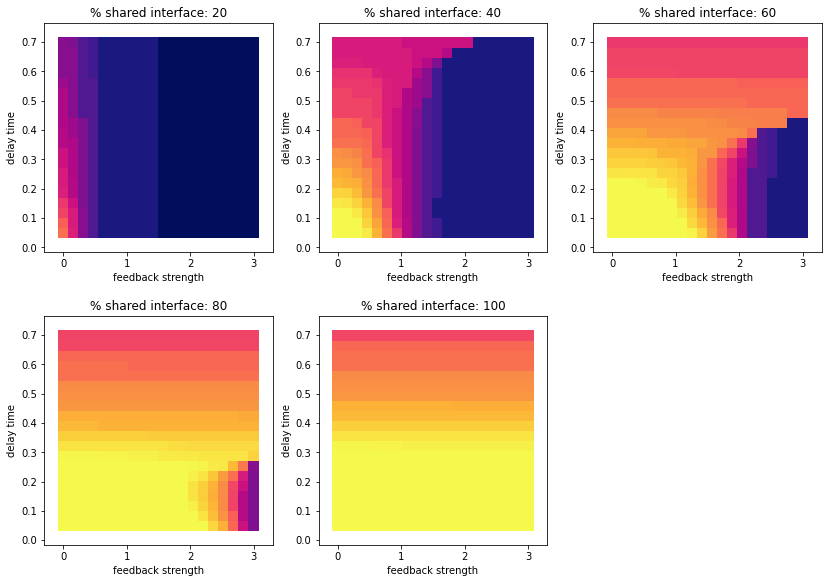

In [139]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data6,
    kdims=["feedback strength", "delay time", ],
    vdims=["Mean wavefront speed", "% shared interface",],
).groupby(
    ["% shared interface",]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
#     logx=True,
    s=120,
    aspect=1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

In [180]:
vmeans6_diff = np.empty((delta_space.size * tau_space.size, 3))
i = 0
for dl in delta_space:
    for tu in tau_space:
        vdiff = (
            vmeans6[
                (param_space[:, 0] == dl)
                & (param_space[:, 1] == eps_space[-1])
                & (param_space[:, 2] == tu)
            ]
            - vmeans6[
                (param_space[:, 0] == dl)
                & (param_space[:, 1] == eps_space[2])
                & (param_space[:, 2] == tu)
            ]
        )
        vmeans6_diff[i] = (dl, tu, vdiff)
        i += 1

In [185]:
data6_diff = pd.DataFrame({
    "feedback strength": vmeans6_diff[:, 0], 
    "delay time": vmeans6_diff[:, 1],
    "speed difference": vmeans6_diff[:, 2], 
})

:Points   [feedback strength,delay time]   (speed difference)
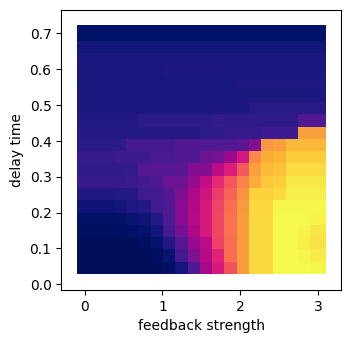

In [187]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data6_diff,
    kdims=["feedback strength", "delay time", ],
    vdims=["speed difference",],
# ).groupby(
#     ["% shared interface",]
).opts(
    color="speed difference",
    cmap=cc.CET_L8,
#     logx=True,
    s=120,
    aspect=1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
# ).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
# ).cols(
#     3
)


hv.output(plt, dpi=100)

<hr>

In [155]:
# alpha = 1.5
# k_s = 0.05
p_s = 2
delta = 3
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

# delay = 0.4

In [156]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [161]:
alpha_space = np.linspace(0.3, 3, 20)
k_s_space = np.logspace(-2, np.log10(0.5), 20)
eps_space = np.linspace(0.2, 1.0, 5)
free_params = (alpha_space, k_s_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [162]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans9 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    alpha, k_s, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    vmeans9[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 2000/2000 [01:42<00:00, 19.58it/s]


In [163]:
data9 = pd.DataFrame({
    "promoter strength": param_space[:, 0], 
    "signaling threshold": param_space[:, 1], 
    "% shared interface": param_space[:, 2] * 100,
    "Mean wavefront speed": vmeans9,
})

:NdLayout   [% shared interface]
   :Points   [signaling threshold,promoter strength]   (Mean wavefront speed,% shared interface)
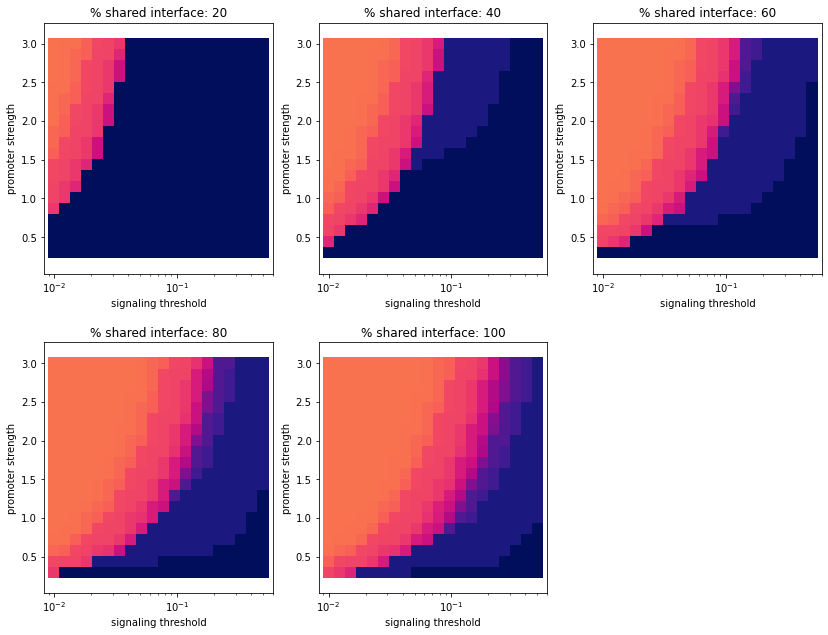

In [165]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=data9,
    kdims=["signaling threshold", "promoter strength",],
    vdims=["Mean wavefront speed", "% shared interface"],
).groupby(
    ["% shared interface"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=130,
    aspect=2.1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
).opts(
    hspace=0.2,
    vspace=0.2,
).cols(3)


plt

<hr>

Compare this to 1 cell!

In [109]:
scL = 1
scn = 2

scX = np.array([[0, 0], [1, 0]])
scAdj = np.array(
    [[0, 1], 
     [1, 0]],
    dtype=np.float32
)

scsender_idx = 0

In [110]:
# Define RHS
@numba.njit
def schex_tc_rhs(E, E_delay, alpha, k, p, delta, lambda_, eps, sender_idx):
    """
    Returns RHS of transceiver DDE.
    """
    # Get signaling across each interface
    E_bar = eps / 6 * (scAdj @ E_delay)
    
    # Calculate dE/dt
    dE_dt = (
        lambda_
        + alpha * (E_bar ** p) / (k ** p + (delta * E_delay) ** p + E_bar ** p)
        - E
    )
    
    # Set sender cell to zero
    dE_dt[sender_idx] = 0
    
    return dE_dt

In [115]:
alpha = 1.5
# k_s = 0.2
# p_s = 2
delta = 0
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(2, dtype=np.float32)
E0[scsender_idx] = 1

k_s_space = np.logspace(-2, np.log10(0.5), 20)
p_s_space = np.linspace(1, 6, 6)
eps_space = np.linspace(0.05, 1, 20)
free_params = (k_s_space, p_s_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

scvmeans = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    k_s, p_s, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    scE = integrate_DDE(
        t_span=t,
        rhs=schex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    scvmeans[i] = act_sc_vmean(t, scE, thresh=0.1, sender_idx=scsender_idx, r=1)

100%|██████████| 2400/2400 [00:28<00:00, 85.40it/s]


In [116]:
scdata = pd.DataFrame({
    "signaling threshold": param_space[:, 0], 
    "ultrasensitivity": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": scvmeans,
})

:NdLayout   [ultrasensitivity]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,ultrasensitivity)
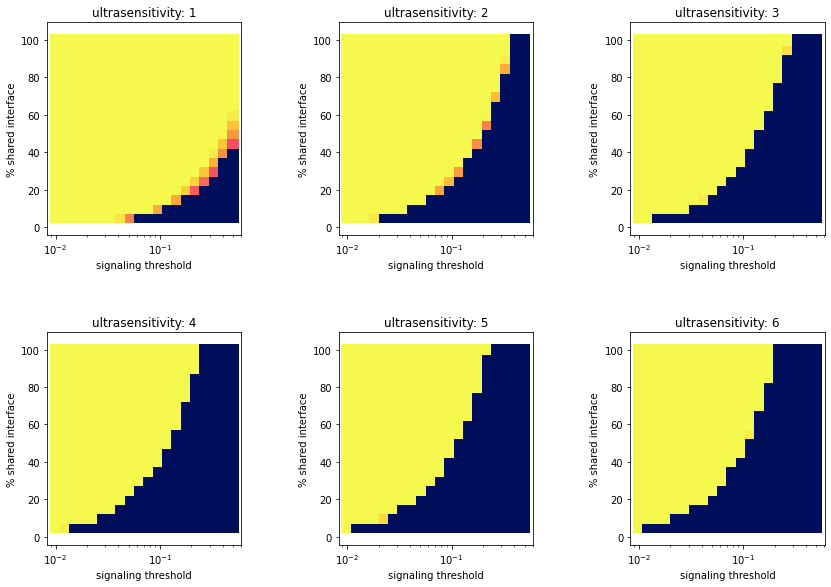

In [117]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=scdata,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "ultrasensitivity"],
).groupby(
    ["ultrasensitivity"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=130,
    aspect=2.1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(3)


plt

In [128]:
alpha = 1.5
# k_s = 0.2
p_s = 2
# delta = 3
lambda_ = 1e-5
# eps = 0.11
# params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(2, dtype=np.float32)
E0[scsender_idx] = 1

k_s_space = np.logspace(-2, np.log10(0.5), 20)
delta_space = np.linspace(0, 5, 6)
eps_space = np.linspace(0.05, 1, 20)
free_params = (k_s_space, delta_space, eps_space)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

scvmeans2 = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    k_s, delta, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    scE = integrate_DDE(
        t_span=t,
        rhs=schex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    
    scvmeans2[i] = act_sc_vmean(t, scE, thresh=0.1, sender_idx=scsender_idx, r=1)

100%|██████████| 2400/2400 [00:28<00:00, 85.11it/s]


In [129]:
scdata2 = pd.DataFrame({
    "signaling threshold": param_space[:, 0], 
    "feedback strength": param_space[:, 1],
    "% shared interface": param_space[:, 2] * 100, 
    "Mean wavefront speed": scvmeans2,
})

:NdLayout   [feedback strength]
   :Points   [signaling threshold,% shared interface]   (Mean wavefront speed,feedback strength)
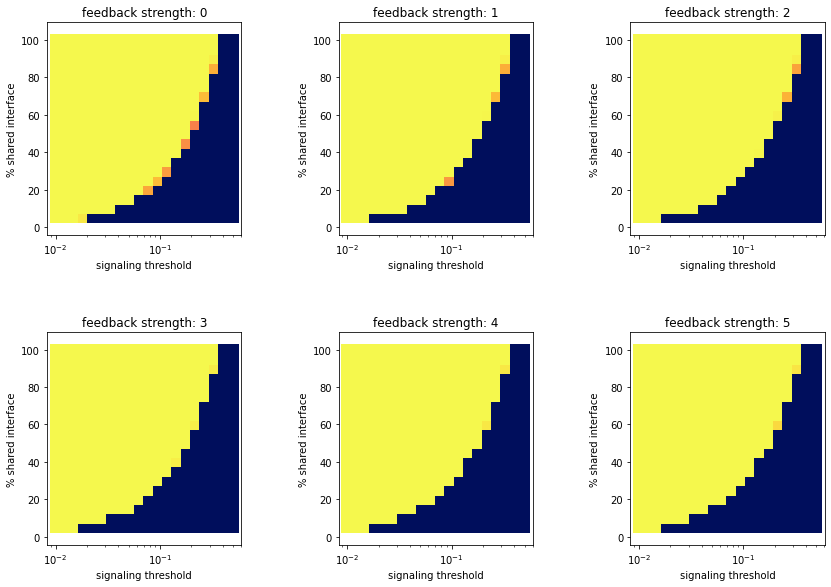

In [130]:
%%capture --no-stdout --no-display

plt = hv.Points(
    data=scdata2,
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "feedback strength"],
).groupby(
    ["feedback strength"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    s=130,
    aspect=2.1,
    padding=0.1,
#     colorbar=True,
).options(
    {'Points': {'marker': "s", 
#                 "edgecolor": "white",
               }}
).redim.range(
    **{"Mean wavefront speed":(0,2)}
).layout(
# ).opts(
#     hspace=0.2,
#     vspace=0.2,
).cols(3)


plt

<hr>

In [547]:
import numpy as np
import pandas as pd
import numba
from math import ceil

from scipy.spatial import Voronoi, voronoi_plot_2d, Delaunay, ConvexHull
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import tqdm

In [548]:
import lattice_signaling as lsig
from scipy.sparse import csr_matrix

In [549]:
# alpha = 2
# k_s = 0.2
p_s = 2
# delta = 3
lambda_ = 1e-5
# eps = 0.11
params = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)

delay = 0.4

In [550]:
dt = 0.005
tmax = 5
t = np.linspace(0, tmax, int(tmax / dt) + 1)

E0 = np.zeros(n, dtype=np.float32)
E0[sender_idx] = 1

In [551]:
alpha_space = np.linspace(0.5, 3, 6)
k_s_space = np.logspace(-2, -0.5, 11)
delta_space = np.linspace(0, 4, 3)
eps = np.linspace(0.05, 1, 10)

free_params = (alpha_space, k_s_space, delta_space, eps)

param_space = np.meshgrid(*free_params)
param_space = np.array(param_space).T.reshape(-1, len(free_params))

In [552]:
n_runs = param_space.shape[0]

iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

E_save_arr = np.empty((n_runs, t.size, n))
for i in iterator:
    alpha, k_s, delta, eps = param_space[i]
    args = (alpha, k_s, p_s, delta, lambda_, eps, sender_idx)
    
    E_save = integrate_DDE(
        t_span=t,
        rhs=hex_tc_rhs,
        dde_args=args,
        E0=E0,
        delay=delay,
        progress_bar=False,
    )
    E_save_arr[i] = E_save


100%|██████████| 1980/1980 [01:56<00:00, 17.03it/s]


In [563]:
iterator = range(n_runs)
iterator = tqdm.tqdm(iterator)

vmeans = np.empty(n_runs, dtype=np.float32)
for i in iterator:
    E = E_save_arr[i]
    vmeans[i] = act_vmean(t, X, E, 0.1, L, chull=True)

100%|██████████| 1980/1980 [00:02<00:00, 853.01it/s]


In [564]:
import colorcet as cc
import holoviews as hv
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [565]:
data = pd.DataFrame({
    "promoter stregth": param_space[:, 0],
    "signaling threshold": param_space[:, 1], 
    "feedback strength": param_space[:, 2],
    "% shared interface": param_space[:, 3] * 100, 
    "Mean wavefront speed": vmeans,
})

In [ ]:
%%capture --no-stdout --no-display

dlt = 0

plt = hv.Points(
    data=data.loc[data["feedback strength"] == dlt, :],
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter stregth"],
).groupby(
    ["promoter stregth"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    aspect=2.3,
    padding=0.1,
    colorbar=True,
    s=120,
).redim.range(
    **{"Mean wavefront speed":(0,None)}
).layout().cols(3)

plt

In [ ]:
%%capture --no-stdout --no-display

dlt = 2

plt = hv.Points(
    data=data.loc[data["feedback strength"] == dlt, :],
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter stregth"],
).groupby(
    ["promoter stregth"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    aspect=2.3,
    padding=0.1,
    colorbar=True,
    s=120,
).redim.range(
    **{"Mean wavefront speed":(0,None)}
).layout().cols(3)

plt

In [ ]:
%%capture --no-stdout --no-display

dlt = 4

plt = hv.Points(
    data=data.loc[data["feedback strength"] == dlt, :],
    kdims=["signaling threshold", "% shared interface"],
    vdims=["Mean wavefront speed", "promoter stregth"],
).groupby(
    ["promoter stregth"]
).opts(
    color="Mean wavefront speed",
    cmap=cc.CET_L8,
    logx=True,
    aspect=2.3,
    padding=0.1,
    colorbar=True,
    s=120
).redim.range(
    **{"Mean wavefront speed":(0,None)}
).layout().cols(3)

plt